In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/us-accidents/US_Accidents_Dec20.csv


## US accident exploratory Data Analysis


Here about the dataset (source ,what is contain ,how it will be useful)
kaggle
information about accidents
can use  useful to prevent accidents

In [2]:
import pandas as pd
data =pd.read_csv('../input/us-accidents/US_Accidents_Dec20.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4232541 entries, 0 to 4232540
Data columns (total 49 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Source                 object 
 2   TMC                    float64
 3   Severity               int64  
 4   Start_Time             object 
 5   End_Time               object 
 6   Start_Lat              float64
 7   Start_Lng              float64
 8   End_Lat                float64
 9   End_Lng                float64
 10  Distance(mi)           float64
 11  Description            object 
 12  Number                 float64
 13  Street                 object 
 14  Side                   object 
 15  City                   object 
 16  County                 object 
 17  State                  object 
 18  Zipcode                object 
 19  Country                object 
 20  Timezone               object 
 21  Airport_Code           object 
 22  Weather_Timestamp 

Data preparation and cleaning

fix any missing and  incorrect values



In [3]:
data.columns


Index(['ID', 'Source', 'TMC', 'Severity', 'Start_Time', 'End_Time',
       'Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)',
       'Description', 'Number', 'Street', 'Side', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Airport_Code', 'Weather_Timestamp',
       'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)',
       'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Weather_Condition', 'Amenity', 'Bump', 'Crossing',
       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station',
       'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [4]:
len(data)

4232541

In [5]:
len(data.columns)

49

In [6]:
data.describe()

,TMC,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,2.716477e+06,4.232541e+06,4.232541e+06,4.232541e+06,1.516064e+06,1.516064e+06,4.232541e+06,1.544592e+06,4.142641e+06,2.336540e+06,4.137074e+06,4.156157e+06,4.133873e+06,3.753215e+06,2.166952e+06
mean,2.083517e+02,2.305035e+00,3.639782e+01,-9.546420e+01,3.690061e+01,-9.859901e+01,3.357021e-01,6.141507e+03,6.147799e+01,5.489319e+01,6.567422e+01,2.969371e+01,9.111991e+00,7.903433e+00,1.244719e-02
std,2.124413e+01,5.332261e-01,4.964404e+00,1.735319e+01,5.165629e+00,1.849590e+01,1.602143e+00,1.492268e+04,1.852586e+01,2.272355e+01,2.272342e+01,8.639260e-01,2.817582e+00,5.330998e+00,1.637154e-01
min,2.000000e+02,1.000000e+00,2.455527e+01,-1.246238e+02,2.457011e+01,-1.244978e+02,0.000000e+00,0.000000e+00,-8.900000e+01,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.010000e+02,2.000000e+00,3.352058e+01,-1.173570e+02,3.385420e+01,-1.182077e+02,0.000000e+00,8.980000e+02,4.900000e+01,3.800000e+01,4.900000e+01,2.964000e+01,1.000000e+01,4.600000e+00,0.000000e+00
50%,2.010000e+02,2.000000e+00,3.582542e+01,-9.002078e+01,3.735134e+01,-9.437987e+01,0.000000e+00,2.890000e+03,6.300000e+01,5.800000e+01,6.800000e+01,2.993000e+01,1.000000e+01,7.000000e+00,0.000000e+00
75%,2.010000e+02,3.000000e+00,4.018313e+01,-8.084682e+01,4.072593e+01,-8.087449e+01,8.900000e-02,7.330000e+03,7.520000e+01,7.300000e+01,8.500000e+01,3.008000e+01,1.000000e+01,1.040000e+01,0.000000e+00
max,4.060000e+02,4.000000e+00,4.900220e+01,-6.711317e+01,4.907500e+01,-6.710924e+01,4.417500e+02,9.999997e+06,2.030000e+02,1.890000e+02,1.000000e+02,5.804000e+01,1.400000e+02,9.840000e+02,2.500000e+01


1. Are there more accidents in warmer or colder areas
2. which 5 states have  the highest number  of accidents?  how about per capita?

In [7]:
numerics=['int16','int32','int64','float16','float32','float64']
numerics_data=data.select_dtypes(include=numerics)
len(numerics_data.columns)

15

In [8]:
 missing_percentages=data.isna().sum().sort_values(ascending=False)/len(data)
 missing_percentages
    

End_Lng                  6.418076e-01
End_Lat                  6.418076e-01
Number                   6.350674e-01
Precipitation(in)        4.880258e-01
Wind_Chill(F)            4.479581e-01
TMC                      3.581924e-01
Wind_Speed(mph)          1.132478e-01
Visibility(mi)           2.331176e-02
Weather_Condition        2.324443e-02
Humidity(%)              2.255548e-02
Temperature(F)           2.124020e-02
Wind_Direction           1.975433e-02
Pressure(in)             1.804684e-02
Weather_Timestamp        1.480057e-02
Airport_Code             2.120003e-03
Timezone                 1.090362e-03
Zipcode                  3.052540e-04
Sunrise_Sunset           3.331332e-05
Civil_Twilight           3.331332e-05
Nautical_Twilight        3.331332e-05
Astronomical_Twilight    3.331332e-05
City                     3.236826e-05
Description              4.725294e-07
Country                  0.000000e+00
Junction                 0.000000e+00
Severity                 0.000000e+00
Start_Time  

In [9]:
type(missing_percentages)

pandas.core.series.Series

In [10]:
missing_percentages[missing_percentages !=0]

End_Lng                  6.418076e-01
End_Lat                  6.418076e-01
Number                   6.350674e-01
Precipitation(in)        4.880258e-01
Wind_Chill(F)            4.479581e-01
TMC                      3.581924e-01
Wind_Speed(mph)          1.132478e-01
Visibility(mi)           2.331176e-02
Weather_Condition        2.324443e-02
Humidity(%)              2.255548e-02
Temperature(F)           2.124020e-02
Wind_Direction           1.975433e-02
Pressure(in)             1.804684e-02
Weather_Timestamp        1.480057e-02
Airport_Code             2.120003e-03
Timezone                 1.090362e-03
Zipcode                  3.052540e-04
Sunrise_Sunset           3.331332e-05
Civil_Twilight           3.331332e-05
Nautical_Twilight        3.331332e-05
Astronomical_Twilight    3.331332e-05
City                     3.236826e-05
Description              4.725294e-07
dtype: float64

<AxesSubplot:>

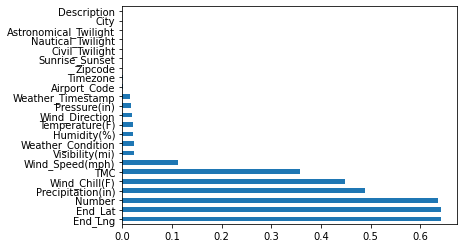

In [11]:
import matplotlib as  plot
missing_percentages[missing_percentages !=0].plot(kind='barh')

In [12]:
data.columns

Index(['ID', 'Source', 'TMC', 'Severity', 'Start_Time', 'End_Time',
       'Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)',
       'Description', 'Number', 'Street', 'Side', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Airport_Code', 'Weather_Timestamp',
       'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)',
       'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Weather_Condition', 'Amenity', 'Bump', 'Crossing',
       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station',
       'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

data columns we gona analyze
1 city
2 start time
3 Start_Lat, 'Start_Lng
4 Temperature
5 weather condition


In [13]:
data.City

0                Dayton
1          Reynoldsburg
2          Williamsburg
3                Dayton
4                Dayton
               ...     
4232536       Riverside
4232537       San Diego
4232538          Orange
4232539     Culver City
4232540        Highland
Name: City, Length: 4232541, dtype: object

In [14]:
cities=data.City.unique()
cities

array(['Dayton', 'Reynoldsburg', 'Williamsburg', ..., 'Paron',
       'Clarksdale', 'American Fork-Pleasant Grove'], dtype=object)

In [15]:
len(cities)

12251

In [16]:
cities_by_accidents=data.City.value_counts()
cities_by_accidents

Houston        114905
Los Angeles     92701
Charlotte       88887
Dallas          77303
Austin          70538
                ...  
Locust Gap          1
Scott Bar           1
West Peoria         1
Lake Ozark          1
Drayton             1
Name: City, Length: 12250, dtype: int64

In [17]:
'NY' in data.City

False

<AxesSubplot:>

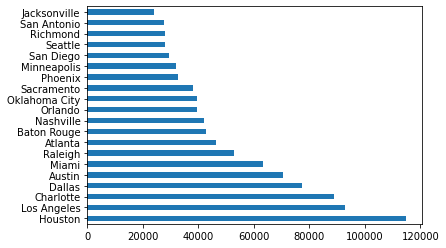

In [18]:
cities_by_accidents[:20].plot(kind='barh')


<AxesSubplot:xlabel='City', ylabel='Count'>

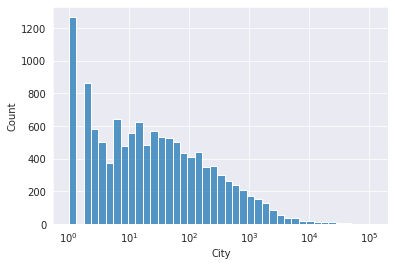

In [19]:
import seaborn as sns
sns.set_style("darkgrid")
sns.histplot(cities_by_accidents,log_scale=True)



In [20]:
cities_by_accidents[cities_by_accidents==1]

Robbinston         1
Leonardville       1
Tumbling Shoals    1
Lowman             1
Curryville         1
                  ..
Locust Gap         1
Scott Bar          1
West Peoria        1
Lake Ozark         1
Drayton            1
Name: City, Length: 1267, dtype: int64

In [21]:
##start time
data.Start_Time

0          2016-02-08 05:46:00
1          2016-02-08 06:07:59
2          2016-02-08 06:49:27
3          2016-02-08 07:23:34
4          2016-02-08 07:39:07
                  ...         
4232536    2019-08-23 18:03:25
4232537    2019-08-23 19:11:30
4232538    2019-08-23 19:00:21
4232539    2019-08-23 19:00:21
4232540    2019-08-23 18:52:06
Name: Start_Time, Length: 4232541, dtype: object

In [22]:
data.Start_Time=pd.to_datetime(data.Start_Time)
data.Start_Time[0]

Timestamp('2016-02-08 05:46:00')

In [23]:
data.Start_Time.dt.hour

0           5
1           6
2           6
3           7
4           7
           ..
4232536    18
4232537    19
4232538    19
4232539    19
4232540    18
Name: Start_Time, Length: 4232541, dtype: int64

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Start_Time'>

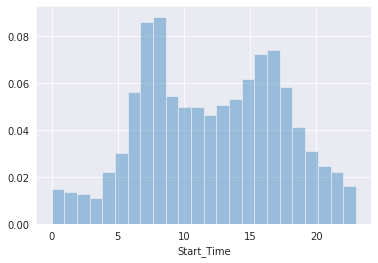

In [24]:
sns.distplot(data.Start_Time.dt.hour,bins =24,kde=False,norm_hist=True)

<AxesSubplot:xlabel='Start_Time'>

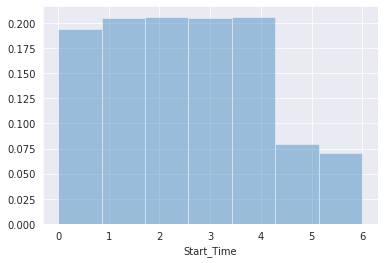

In [25]:
sns.distplot(data.Start_Time.dt.dayofweek,bins =7,kde=False,norm_hist=True)

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Start_Time'>

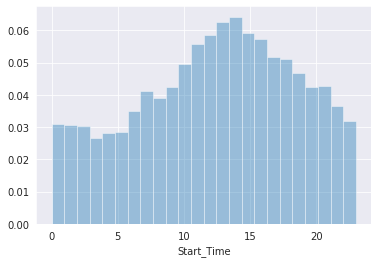

In [26]:
Sundays_Start_time=data.Start_Time[data.Start_Time.dt.dayofweek==6]
sns.distplot(Sundays_Start_time.dt.hour,bins =24,kde=False,norm_hist=True)

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Start_Time'>

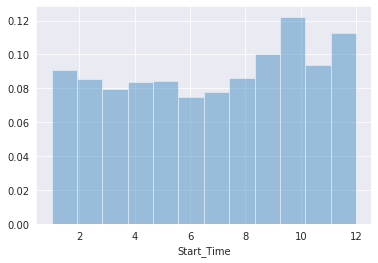

In [32]:
data_2019=data[data.Start_Time.dt.year==2019]   
sns.distplot(data_2019.Start_Time.dt.month,bins =12,kde=False,norm_hist=True)

In [38]:
data.Source

0          MapQuest
1          MapQuest
2          MapQuest
3          MapQuest
4          MapQuest
             ...   
4232536        Bing
4232537        Bing
4232538        Bing
4232539        Bing
4232540        Bing
Name: Source, Length: 4232541, dtype: object

<AxesSubplot:xlabel='Start_Time'>

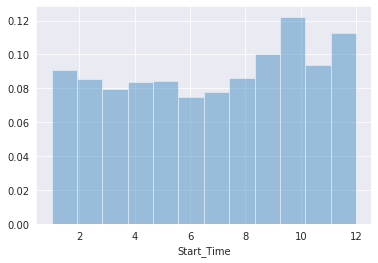

In [40]:
data_2019_mapquest=data_2019[data_2019.Source=="MapQuest"]
sns.distplot(data_2019.Start_Time.dt.month,bins =12,kde=False,norm_hist=True)

<AxesSubplot:xlabel='Start_Time'>

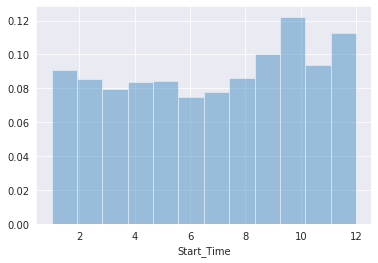

In [41]:
data_2019_bing=data_2019[data_2019.Source=="Bing"]
sns.distplot(data_2019.Start_Time.dt.month,bins =12,kde=False,norm_hist=True)

<AxesSubplot:ylabel='Source'>

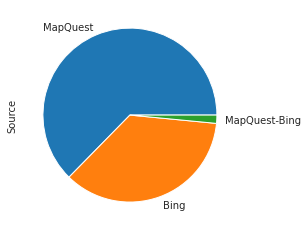

In [43]:
data.Source.value_counts().plot(kind='pie')

In [ ]:
##Start lat,Start log

In [44]:
data.Start_Lat

0          39.865147
1          39.928059
2          39.063148
3          39.747753
4          39.627781
             ...    
4232536    34.002480
4232537    32.766960
4232538    33.775450
4232539    33.992460
4232540    34.133930
Name: Start_Lat, Length: 4232541, dtype: float64

In [47]:
data.Start_Lng

0          -84.058723
1          -82.831184
2          -84.032608
3          -84.205582
4          -84.188354
              ...    
4232536   -117.379360
4232537   -117.148060
4232538   -117.847790
4232539   -118.403020
4232540   -117.230920
Name: Start_Lng, Length: 4232541, dtype: float64

<AxesSubplot:xlabel='Start_Lng', ylabel='Start_Lat'>

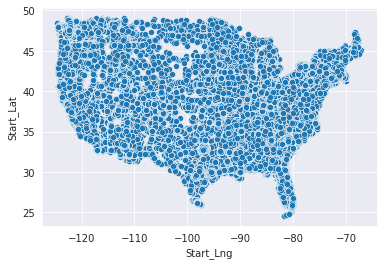

In [50]:
sns.scatterplot(x=data.Start_Lng,y=data.Start_Lat)

In [53]:
sample_data=data.sample(int(0.1*len(data)))

<AxesSubplot:xlabel='Start_Lng', ylabel='Start_Lat'>

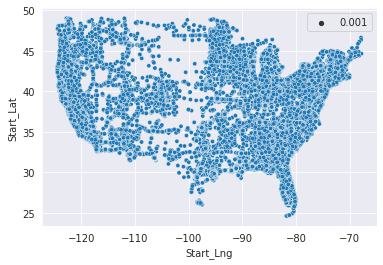

In [55]:
sns.scatterplot(x=sample_data.Start_Lng,y=sample_data.Start_Lat,size=0.001)

In [69]:
lat,lng =data.Start_Lat[0],data.Start_Lng[0]
lat,lng

(39.865147, -84.058723)

In [72]:
list(zip(list(data.Start_Lat),list(data.Start_Lng)))

[(39.865147, -84.058723),
 (39.928059, -82.831184),
 (39.063148, -84.032608),
 (39.747753, -84.205582),
 (39.627781, -84.188354),
 (40.10059, -82.925194),
 (39.758274, -84.230507),
 (39.770382, -84.194901),
 (39.778061, -84.172005),
 (40.10059, -82.925194),
 (39.952812, -83.119293),
 (39.932709, -82.83091),
 (39.737633, -84.149933),
 (39.79076, -84.241547),
 (39.972038, -82.913521),
 (39.745888, -84.17041),
 (39.748329, -84.224007),
 (39.752174, -84.239952),
 (39.740669, -84.184135),
 (39.790703, -84.244461),
 (40.052509, -82.882332),
 (39.773346, -84.224686),
 (39.628288, -84.226151),
 (40.023487, -82.994888),
 (39.761379, -84.259216),
 (40.158024, -82.641762),
 (39.733219, -84.159653),
 (39.775303, -84.200523),
 (39.789322, -84.239105),
 (39.75872, -84.183762),
 (40.081459, -83.122398),
 (39.83321, -84.112946),
 (40.042725, -82.997307),
 (39.974415, -82.848854),
 (39.994766, -83.02449),
 (40.006477, -83.030991),
 (39.742062, -84.186996),
 (39.843521, -82.78157),
 (39.782578, -84.1786

In [79]:
import folium
from folium.plugins import HeatMap



In [87]:
sample_df=data.sample(int(0.1*len(data)))
lat_lng_pairs=list(zip(list(sample_df.Start_Lat),list(sample_df.Start_Lng)))

In [89]:
map=folium.Map()
HeatMap(lat_lng_pairs).add_to(map)
map